# CellRank Basics

This tutorial introduces you to CellRank’s high level API for computing initial & terminal states and fate probabilities. Once we have the fate probabilities, this tutorial shows you how to use them to plot a directed [Wolf et al., 2019], to compute putative lineage drivers and to visualize smooth gene expression trends. If you want a bit more control over how initial & terminal states and fate probabilities are computed, then you should check out CellRank’s low level API, composed of kernels and estimators. This really isn’t any more complicated than using scikit-learn, so please do check out the Kernels and estimators tutorial.

In this tutorial, we will use RNA velocity and transcriptomic similarity to estimate cell-cell transition probabilities. Using kernels and estimators, you can apply CellRank even without RNA velocity information, check out our CellRank beyond RNA velocity tutorial. CellRank generalizes beyond RNA velocity and is a widely applicable framework to model single-cell data based on the powerful concept of Markov chains.

The first part of this tutorial is very similar to scVelo’s tutorial on pancreatic endocrinogenesis. The data we use here comes from [Bastidas-Ponce et al., 2019]. For more info on scVelo, see the documentation or take a look at [Bergen et al., 2020].

This tutorial notebook can be downloaded using the following link.

# Import Packages and Data

Easiest way to start is to download Miniconda3 along with the environment file found here. To create the environment, run conda create -f environment.yml.

In [1]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import os.path as op
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.insert(1, "/Users/geenaildefonso/Projects/")
import mazebox as mb
sys.path.insert(1, '/Users/geenaildefonso/Dropbox (VU Basic Sciences)/')

In [2]:
import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [3]:
scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [4]:
adata = scv.read('/Users/geenaildefonso/Dropbox (VU Basic Sciences)/RPM/adata05.h5ad')

In [ ]:
pseudo = pd.read_csv('../data/PseudoCorr.csv', index_col=0, header = 0)
pseudo.head()

In [ ]:
pseudo.reset_index(level=0, inplace=True) #changes the index to a column

In [ ]:
pseudo.head()

In [ ]:
bcs = pd.read_csv('/Users/geenaildefonso/Dropbox (VU Basic Sciences)/data/RPM_cell_barcodes.csv', index_col=0, header = 0)
bcs.head()

In [ ]:
bcs['barcode_short'] = [i.split('_')[0] for i in bcs['Tumor Cell Barcodes']]

# pseudo['Barcode'] = [str(i.split(":")[1].split('x')[0]) for i in pseudo['Barcode']]

filtered_cells = []
for i in pseudo['Barcode']:
    if i in list(bcs['barcode_short']): 
        filtered_cells.append(True)
    else:
        filtered_cells.append(False)
pseudo['kept'] = filtered_cells
# sc.pl.umap(adata, color = 'kept')

In [ ]:
pseudo

In [ ]:
adata = adata[adata.obs['kept'],:]

In [ ]:
adata.write_h5ad('../int/adata01.h5ad')

In [ ]:
adata = sc.read_h5ad('../int/adata01.h5ad')

In [ ]:
adata = scv.read('RPM_adata_dynamicalmodeling_7548genes.h5ad')

In [ ]:
adata

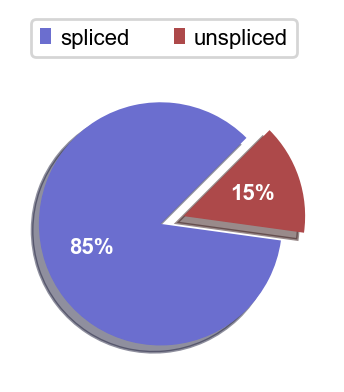

AnnData object with n_obs × n_vars = 15257 × 21163
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'batch', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ambient', 'log1p_total_counts_ambient', 'pct_counts_ambient', 'arcsinh_total_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'barcode', 'kept', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'dpt_pseudotime', 'col', 'absorbing', 'absorb_group', 'log1p_plasticity', 'SCLC-Y_Score', 'SCLC-Y_Col', 'SCLC-P_Score', 'SCLC-P_Col', 'SCLC-N_Score', 'SCLC-N_Col', 'SCLC-A2_Score', 'SCLC-A2_Col', 'SCLC-A_Score', 'SCLC-A_Col', 'Phenotype_unfiltered', 'max', 'SCLC-Yscore', 'SCLC-Yco

In [5]:
scv.pl.proportions(adata)
adata

# Run scVelo

We will use the dynamical model from scVelo to estimate the velocities. Please make sure to have at least version 0.2.3 of scVelo installed to make use parallelisation in scv.tl.recover_dynamics. On my laptop, using 8 cores, the below cell takes about 1:30 min to execute.

In [67]:
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM', 'Tmed11', 'Rsl24d1','Olfr123', 'Adam20','Srsf2', 'G3bp1', 'Snrpd1', 'Pgk1', 'Rps3', 'Psmd1', 'Orc2', 'Psma2', 'Syncrip', 'Cnbp',
            'Gspt1', 'Ppm1g', 'Eif4e', 'Hnrnpa3', 'Abce1', 'Hnrnpu',  'Ifrd1', 'Kpna2', 'Dhx15', 'Mcm4']

In [ ]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, retain_genes = tfs)
sc.tl.pca(adata)
# sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
# scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

In [7]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/16 cores)


  0%|          | 0/2710 [00:00<?, ?gene/s]

    finished (1:02:45) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


Once we have the parameters, we can use these to compute the velocities and the velocity graph. The velocity graph is a weighted graph that specifies how likely two cells are to transition into another, given their velocity vectors and relative positions.

In [8]:
scv.tl.velocity(adata, mode="dynamical")
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:01:41) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/15257 [00:00<?, ?cells/s]

    finished (0:01:54) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [ ]:
# scv.pl.velocity_embedding_stream(
#     adata, basis="umap", legend_fontsize=12, title="", smooth=0.8, min_mass=4
# )

scv.pl.velocity_embedding_stream(adata, basis='umap',color=['timepoint'])

In [ ]:
scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity_graph(adata)

# Run CellRank

CellRank offers various ways to infuse directionality into single-cell data. Here, the directional information comes from RNA velocity, and we use this information to compute initial & terminal states as well as fate probabilities for the dynamical process of pancreatic development.

# Identify Terminal States

Terminal states can be computed by running the following command:


Solving TSP for `4` states


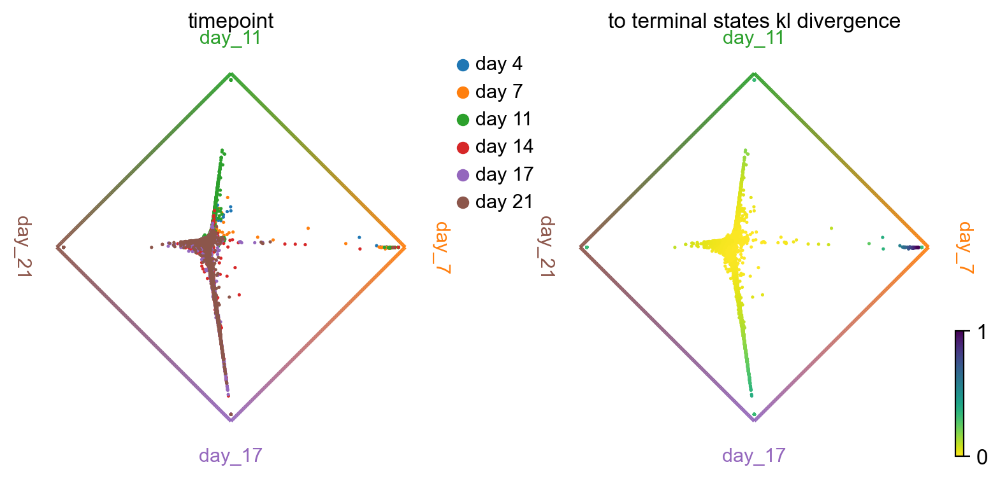

In [61]:
cr.pl.circular_projection(
    adata, keys=["timepoint", "kl_divergence"], legend_loc="upper right"
)

In [17]:
cr.tl.terminal_states(adata, cluster_key="timepoint", weight_connectivities=0.2)

Accessing `adata.obsp['T_fwd']`
Using precomputed transition matrix
Computing eigendecomposition of the transition matrix


/var/folders/mk/5gzhv5l57n56d6x7fnfgzpw00000gn/T/ipykernel_38754/651322716.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata, cluster_key="timepoint", weight_connectivities=0.2)


Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:00)
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000011e+00 -4.4019882687978566e-04 1.7358446714044266e-04 3.9125076334087178e-03 
0.0000000000000000e+00 9.9896244295915004e-01 -2.8584403280880585e-04 2.9489542235420753e-04 
0.0000000000000000e+00 0.0000000000000000e+00 9.8942696936130436e-01 -2.2686918759708859e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.7391791193768640e-01 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_ma

In [62]:
cr.tl.lineages(adata)

model = cr.ul.models.GAM(adata)

Computing absorption probabilities


/var/folders/mk/5gzhv5l57n56d6x7fnfgzpw00000gn/T/ipykernel_38754/919501433.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/4 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

    Finish (0:00:00)


/Users/geenaildefonso/anaconda/envs/mazebox_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/geenaildefonso/anaconda/envs/mazebox_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

Plotting trends


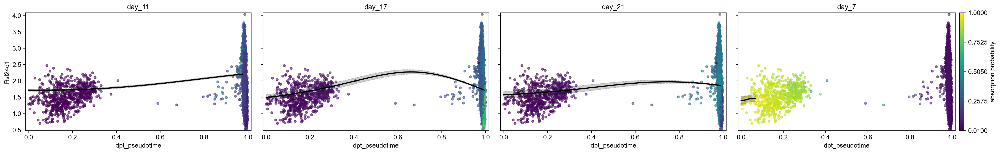

In [66]:
cr.pl.gene_trends(
    adata,
    model,
    ['Rsl24d1'],
    data_key="Ms",
    time_key="dpt_pseudotime",
    show_progress_bar=False,
)

The most important parameters in the above function are:

estimator: this determines what’s going to behind the scenes to compute the terminal states. Options are cr.tl.estimators.CFLARE (“Clustering and Filtering of Left and Right Eigenvectors”) or cr.tl.estimators.GPCCA (“Generalized Perron Cluster Cluster Analysis, [Reuter et al., 2018] and [Reuter et al., 2019], see also our pyGPCCA implementation). The latter is the default, it computes terminal states by coarse graining the velocity-derived Markov chain into a set of macrostates that represent the slow-time scale dynamics of the process, i.e. it finds the states that you are unlikely to leave again, once you have entered them.

cluster_key: takes a key from adata.obs to retrieve pre-computed cluster labels, i.e. ‘clusters’ or ‘louvain’. These labels are then mapped onto the set of terminal states, to associate a name and a color with each state.

n_states: number of expected terminal states. This parameter is optional - if it’s not provided, this number is estimated from the so-called ‘eigengap heuristic’ of the spectrum of the transition matrix.

method: This is only relevant for the estimator GPCCA. It determines the way in which we compute and sort the real Schur decomposition. The default, krylov, is an iterative procedure that works with sparse matrices which allows the method to scale to very large cell numbers. It relies on the libraries SLEPc and PETSc, which you will have to install separately, see our installation instructions. If your dataset is small (<5k cells), and you don’t want to install these at the moment, use method='brandts' [Brandts, 2002]. The results will be the same, the difference is that brandts works with dense matrices and won’t scale to very large cells numbers.

weight_connectivities: weight given to cell-cell similarities to account for noise in velocity vectors.

When running the above command, CellRank adds a key terminal_states to adata.obs and the result can be plotted as:

saving figure to file ./figures/scvelo_terminal_states_timepoint_0.2.pdf


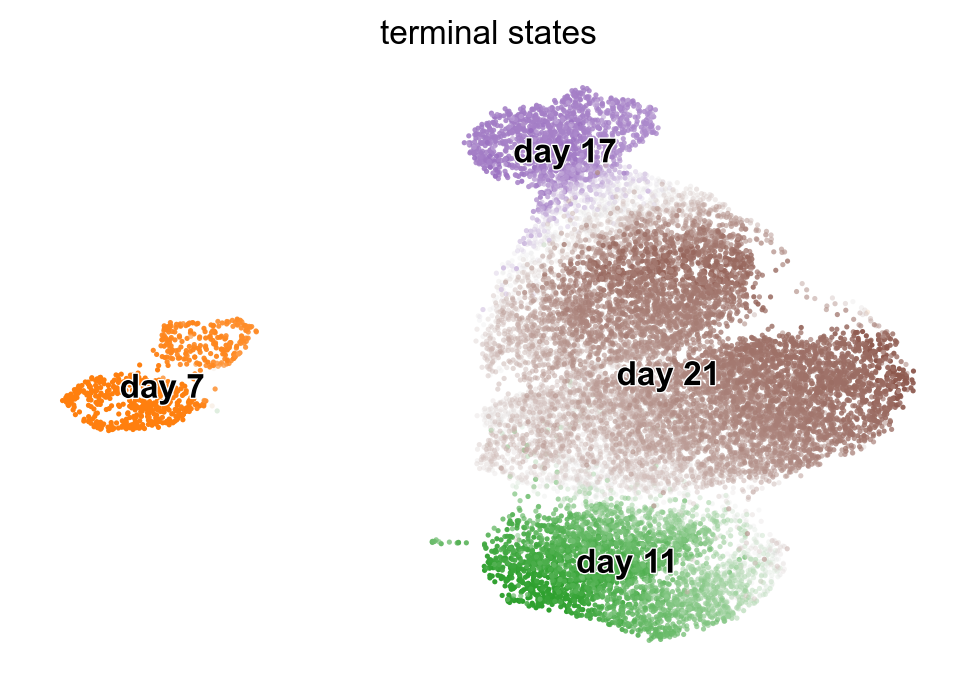

In [18]:
cr.pl.terminal_states(adata, save = 'terminal_states_timepoint_0.2.pdf')

# Identify Initial States

The same sort of analysis can now be repeated for the initial states, only that we use the function cr.tl.initial_states this time:

Accessing `adata.obsp['T_bwd']`
Using precomputed transition matrix
Computing eigendecomposition of the transition matrix


/var/folders/mk/5gzhv5l57n56d6x7fnfgzpw00000gn/T/ipykernel_38754/1684950437.py:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key="timepoint")


Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:01)
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999500e-01 -2.9428609017959946e-04 
0.0000000000000000e+00 9.9747576983479846e-01 
0.0000000000000000e+00 0.0000000000000000e+00 
Adding `adata.uns['eigendecomposition_bwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
saving figure to file ./figures/scvelo_initial_states_timepoint.pdf


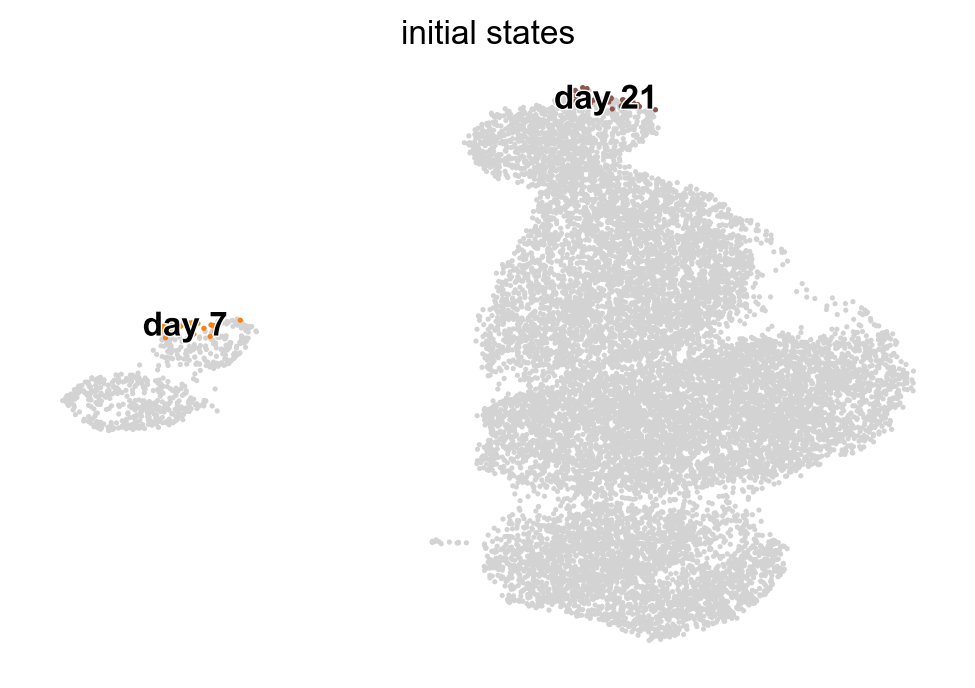

In [13]:
cr.tl.initial_states(adata, cluster_key="timepoint")
cr.pl.initial_states(adata, discrete=True, save = 'initial_states_timepoint.pdf')

# Computing Fate Maps

Once we know the terminal states, we can compute associated fate maps - for each cell, we ask how likely is the cell to develop towards each of the identified terminal states.

Computing absorption probabilities


/var/folders/mk/5gzhv5l57n56d6x7fnfgzpw00000gn/T/ipykernel_38754/4053726318.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/4 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
saving figure to file ./figures/scvelo_absorption_prob_to_term_states.pdf


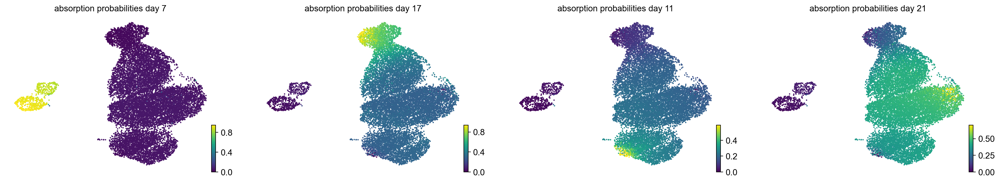

In [19]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False, save = 'absorption_prob_to_term_states.pdf')

We can aggregate the above into a single, global fate map where we associate each terminal state with color and use the intensity of that color to show the fate of each individual cell:

saving figure to file ./figures/scvelo_absorption_prob_lineages_to_term_states.pdf


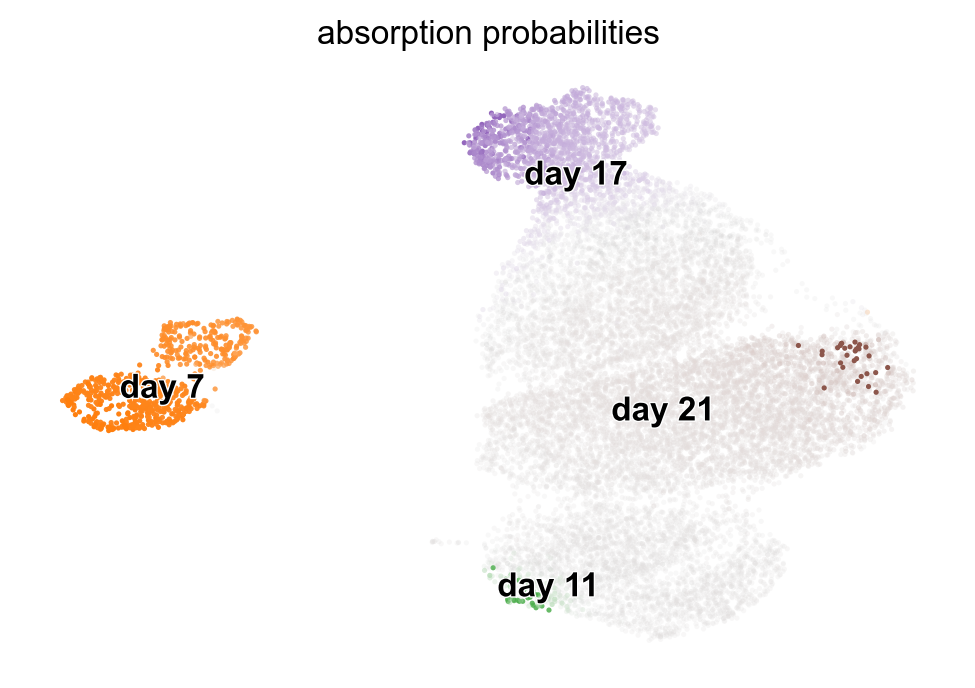

In [21]:
cr.pl.lineages(adata, same_plot=True, save = 'absorption_prob_lineages_to_term_states.pdf')

# Directed PAGA

We can further aggregate the individual fate maps into a cluster-level fate map using an adapted version of [Wolf et al., 2019] with directed edges. We first compute scVelo’s latent time with CellRank identified root_key and end_key, which are the probabilities of being an initial or a terminal state, respectively.

In [22]:
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:38) --> added 
    'latent_time', shared time (adata.obs)


Next, we can use the inferred pseudotime along with the initial and terminal states probabilities to compute the directed PAGA.

In [23]:
scv.tl.paga(
    adata,
    groups="timepoint",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:25) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


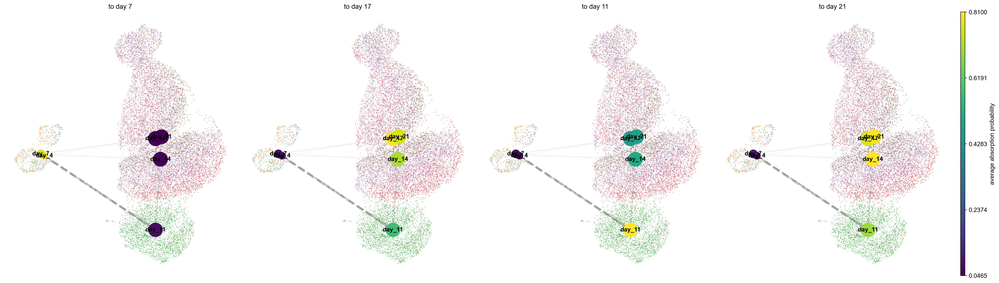

In [47]:
cr.pl.cluster_fates(
    adata,
    mode="paga",
    cluster_key="timepoint",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="on data",
    node_size_scale=4,
    edge_width_scale=1,
    max_edge_width=4,
    title="Directed PAGA",figsize = (25, 7), save = 'paga_timepoint.pdf'
)

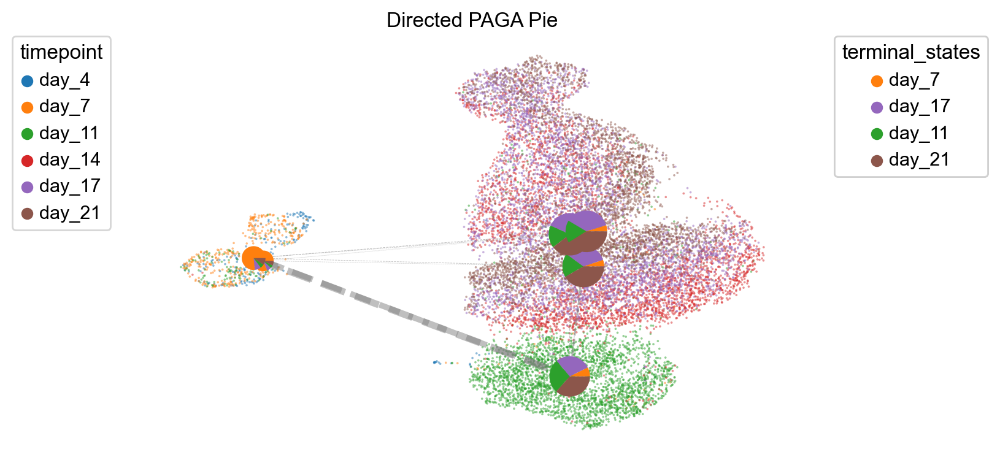

In [48]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="timepoint",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=4,
    edge_width_scale=1,
    max_edge_width=4,
    title="Directed PAGA Pie",save = 'paga_pie_timepoint.pdf'
)

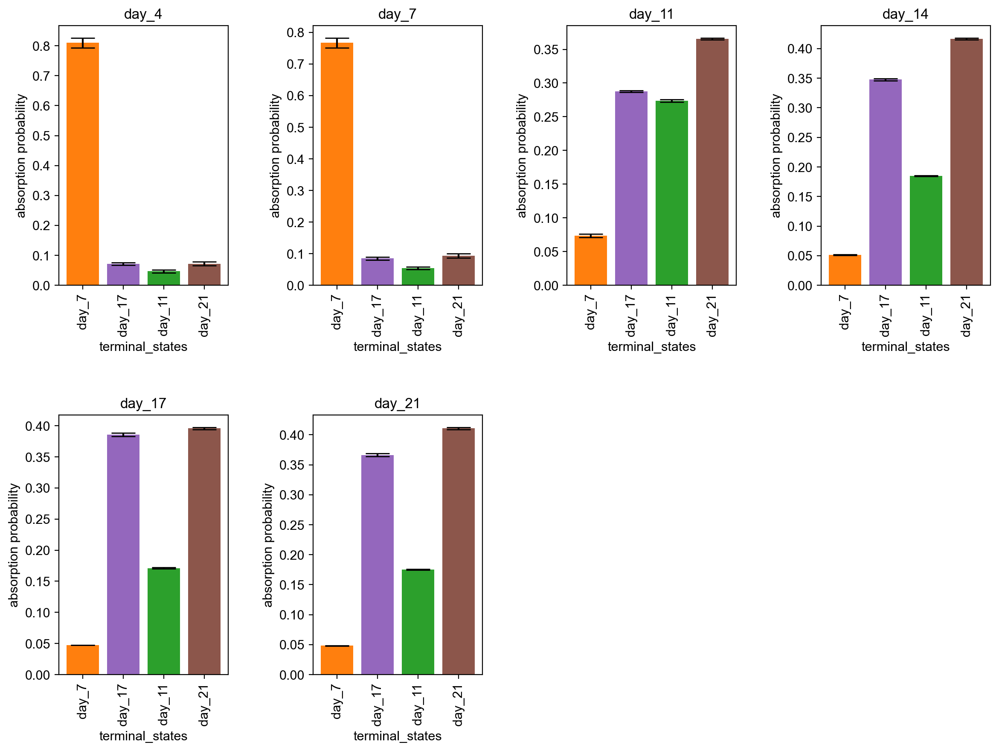

In [49]:
cr.pl.cluster_fates(
    adata,
    mode="bar",
    cluster_key="timepoint",
    basis="umap", save = 'paga_bar_timepoint.pdf'
)

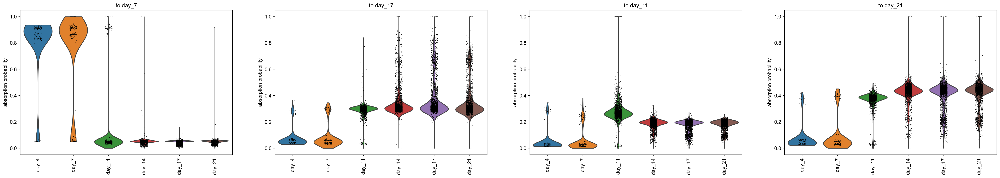

In [51]:
cr.pl.cluster_fates(
    adata,
    mode="violin",
    cluster_key="timepoint",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=4,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA", figsize = (30, 5),save = 'paga_violin_timepoint.pdf'
)

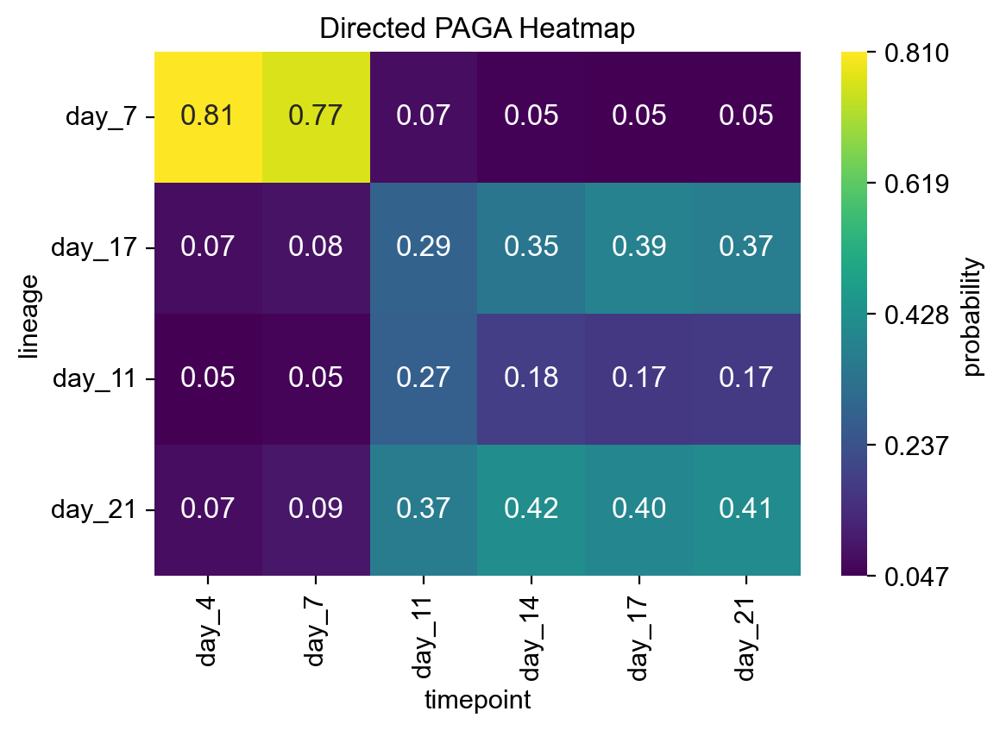

In [52]:
cr.pl.cluster_fates(
    adata,
    mode="heatmap",
    cluster_key="timepoint",
    basis="umap",
    title="Directed PAGA Heatmap",save = 'paga_heatmap_timepoint.pdf'
)

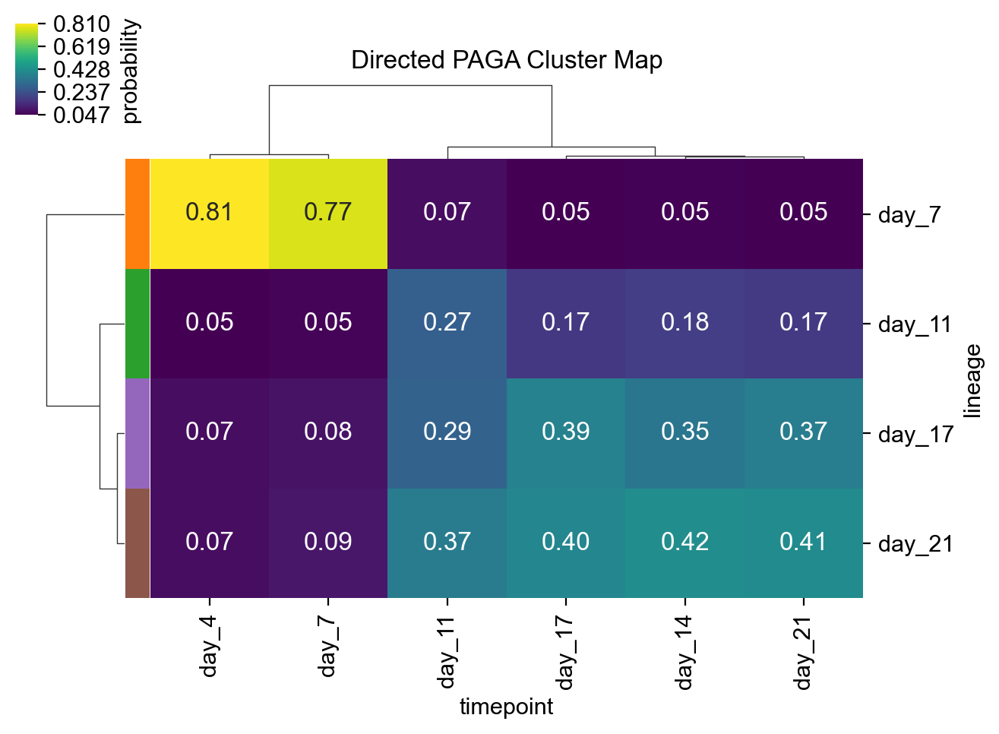

In [53]:
cr.pl.cluster_fates(
    adata,
    mode="clustermap",
    cluster_key="timepoint",
    basis="umap",
    title="Directed PAGA Cluster Map",save = 'paga_clustermap_timepoint.pdf'
)

We use pie charts to show cell fates averaged per cluster. Edges between clusters are given by transcriptomic similarity between the clusters, just as in normal PAGA.

# Compute Lineage Drivers

We can compute the driver genes for all or just a subset of lineages. We can also restrict this to some subset of clusters by specifying clusters=... (not shown below). In the resulting dataframe, we also see the p-value, the corrected p-value (q-value) and the 95% confidence interval for the correlation statistic.

In [56]:
cr.tl.lineage_drivers(adata)

/var/folders/mk/5gzhv5l57n56d6x7fnfgzpw00000gn/T/ipykernel_38754/1721556810.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:13)


,day_7_corr,day_7_pval,day_7_qval,day_7_ci_low,day_7_ci_high,day_17_corr,day_17_pval,day_17_qval,day_17_ci_low,day_17_ci_high,day_11_corr,day_11_pval,day_11_qval,day_11_ci_low,day_11_ci_high,day_21_corr,day_21_pval,day_21_qval,day_21_ci_low,day_21_ci_high
Ascl1,0.960678,0.0,NaN,0.959436,0.961883,-0.421961,0.0,NaN,-0.434917,-0.408831,-0.439580,0.0,NaN,-0.452293,-0.426688,-0.613828,0.0,NaN,-0.623622,-0.603842
Ccn3,0.930032,0.0,NaN,0.927858,0.932144,-0.421967,0.0,NaN,-0.434922,-0.408836,-0.411084,0.0,NaN,-0.424185,-0.397812,-0.587475,0.0,NaN,-0.597771,-0.576986
Bex2,0.916876,0.0,NaN,0.914311,0.919369,-0.429237,0.0,NaN,-0.442094,-0.416204,-0.388534,0.0,NaN,-0.401924,-0.374977,-0.574228,0.0,NaN,-0.584768,-0.563495
Bex4,0.897087,0.0,NaN,0.893944,0.900141,-0.433731,0.0,NaN,-0.446526,-0.420759,-0.369580,0.0,NaN,-0.383201,-0.355799,-0.552018,0.0,NaN,-0.562955,-0.540888
Aldh1a7,0.891591,0.0,NaN,0.888291,0.894800,-0.393583,0.0,NaN,-0.406909,-0.380089,-0.407676,0.0,NaN,-0.420822,-0.394359,-0.567444,0.0,NaN,-0.578106,-0.556587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Nr0b1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sox1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Chat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Neurod1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Afterwards, we can plot the top 5 driver genes (based on the correlation), e.g. for the Alpha lineage:

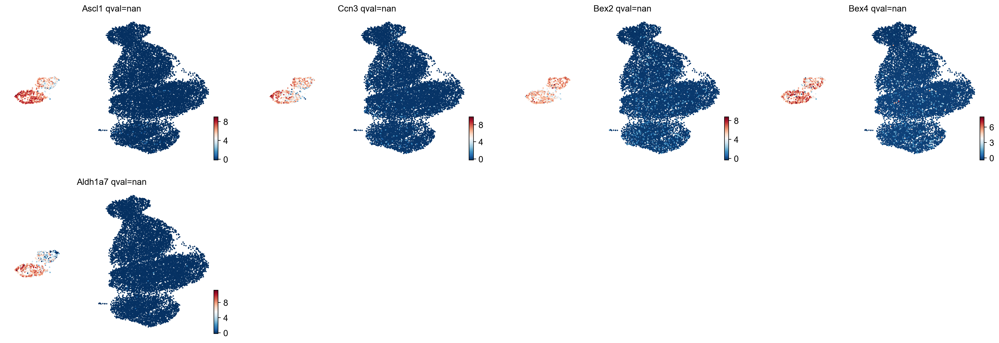

In [57]:
cr.pl.lineage_drivers(adata, lineage="day_7", n_genes=5)

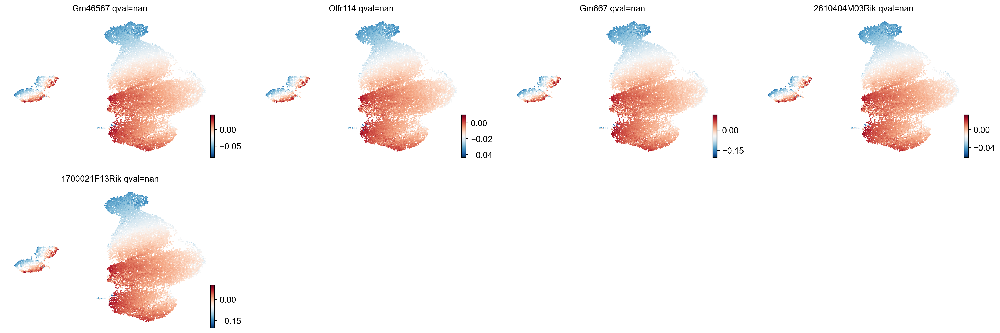

In [58]:
cr.pl.lineage_drivers(adata, lineage="day_11", n_genes=5)

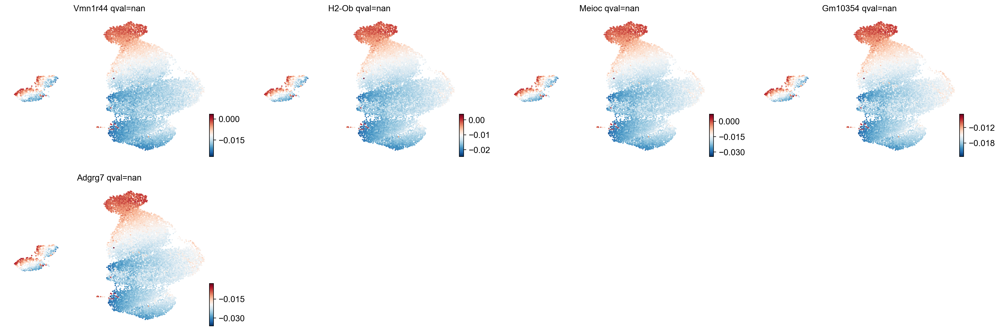

In [59]:
cr.pl.lineage_drivers(adata, lineage="day_17", n_genes=5)

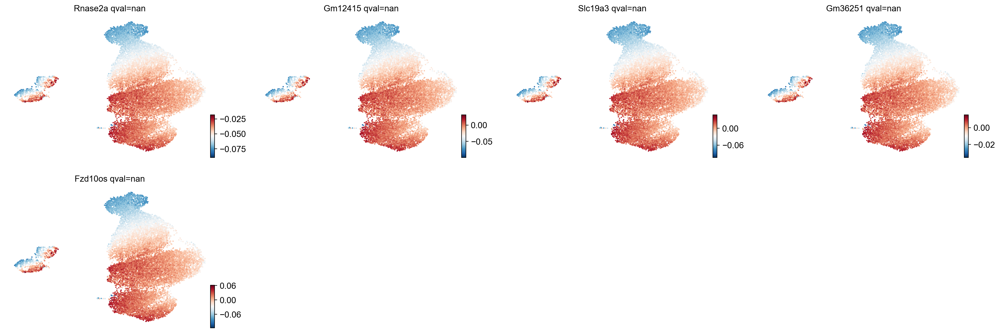

In [60]:
cr.pl.lineage_drivers(adata, lineage="day_21", n_genes=5)

# Gene expression trends

The functions demonstrated above are the main functions of CellRank: computing initial and terminal states and probabilistic fate maps. We can use the computed probabilities now to e.g. smooth gene expression trends along lineages.

Let’s start with a temporal ordering for the cells. To get this, we can compute scVelo’s latent time, as computed previously, or alternatively, we can just use CellRank’s initial states to compute a [Haghverdi et al., 2016].

In [ ]:
# compue DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "1_2")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.dpt(adata)

scv.pl.scatter(
    adata,
    color=["Clusters", root_idx, "latent_time", "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["clusters", "root cell", "latent time", "dpt pseudotime"],
)

We can plot dynamics of genes in pseudotime along individual trajectories, defined via the fate maps we computed above.

In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=['Srsf2', 'G3bp1', 'Snrpd1'],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

We can also visualize the lineage drivers computed above in a heatmap. Below, we do this for the Alpha lineage, i.e. we smooth gene expression for the putative Alpha-drivers in pseudotime, using as cell-level weights the Alpha fate probabilities. We sort genes according to their peak in pseudotime, thus revealing a cascade of gene expression events.

In [ ]:
cr.pl.heatmap(
    adata,
    model,
    genes=adata.varm['terminal_lineage_drivers']["0_3_corr"].sort_values(ascending=False).index[:100],
    show_absorption_probabilities=True,
    lineages="0_3",
    n_jobs=1,
    backend="loky",
)